The goal of this notebook is to evaluate the embeddings that we have created. Specifically, we are interested in how well (both qualitative and quantitatively) our embeddings do at matching questions with context in the statement portion of the earnings call transcript. Since we divided the statements portion of each earnings call transcript into chunks of size at most 64 words, this reduces to matching each question with the statement chunk that is most "similar" in terms of some predefined similarity metric (e.g. cosine similarity).

In [1]:
import numpy as np
import pickle
import matplotlib.pyplot as plt

In [2]:
# Change this to point to your embeddings
FILE_PATH = 'embeddings/bag_of_words.pickle'

In [3]:
with open(FILE_PATH, 'rb') as f:
    transcript_embeddings = pickle.load(f)

In [4]:
def cosine_sim(u, v, sparse=False):
    if sparse:
        u = u.toarray().T
        v = v.toarray().T
    u = np.reshape(u, (u.shape[0],))
    v = np.reshape(v, (v.shape[0],))
    return np.dot(u.T, v) / (np.linalg.norm(u) * np.linalg.norm(v))

In [5]:
def jaccard_sim(u, v, sparse=False):
    if sparse:
        u = u.toarray().T
        v = v.toarray().T
    return np.sum(np.minimum(u, v)) / np.sum((u + v))

In [6]:
# Define this as you see fit
sim_func = cosine_sim

In [7]:
NUM_SAMPLES = len(transcript_embeddings)

In [9]:
q_to_chunk = []
scores = []
for i in range(NUM_SAMPLES):
    curr = {}
    for q_a_idx in range(len(transcript_embeddings[i][1])):
        if transcript_embeddings[i][1][q_a_idx][1] == 1: continue  # This is an answer
        q_embedding = transcript_embeddings[i][1][q_a_idx][0]
        
        curr_best_score, curr_best_chunk = None, None
        for chunk_idx in range(len(transcript_embeddings[i][0])):
            chunk_embedding = transcript_embeddings[i][0][chunk_idx]
            score = sim_func(q_embedding, chunk_embedding, sparse=True)
            
            if curr_best_score is None or score > curr_best_score:
                curr_best_score = score
                curr_best_chunk = chunk_idx
        scores.append(curr_best_score)
        curr[q_a_idx] = curr_best_chunk
    q_to_chunk.append(curr)

/anaconda3/envs/nlu/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


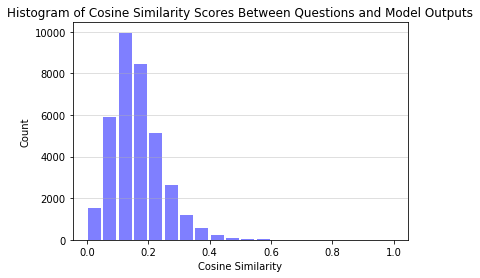

In [10]:
num_bins = 20
n, bins, patches = plt.hist(scores, num_bins, facecolor='blue', alpha=0.5, rwidth=0.85)
plt.grid(axis='y', alpha=0.5)
plt.xlabel('Cosine Similarity')
plt.ylabel('Count') # Adjust if using Jaccard Similarity
plt.title(r'Histogram of Cosine Similarity Scores Between Questions and Model Outputs')
plt.show()

In [11]:
# Now we load the original transcripts (only using the training data for now)
with open('data/transcripts_train.pickle', 'rb') as f:
    transcripts = pickle.load(f)

In [12]:
for i, mapping in enumerate(q_to_chunk):
    for q_idx in mapping.keys():
        print ("QUESTION TEXT:\n")
        print(transcripts[i][3][q_idx][0])
        print("\nANSWER TEXT\n")
        print(transcripts[i][3][q_idx + 1][0])
        print("\nMODEL OUTPUT:\n")
        print(transcripts[i][2][mapping[q_idx]] + '\n')
        print('#' * 75)

QUESTION TEXT:

operator instructions first question comes line bruce geller dghm please proceed hi good morning guys

MODEL OUTPUT:

questions please feel free butt ask question want

###########################################################################
QUESTION TEXT:

good thanks glad hear things turned around far current quarter 7 negative comp related 13 weeks versus 14 weeks

MODEL OUTPUT:

two oyster house properties alabama productive properties think made good purchase consideration acreage buildings bought one gulf shores part mall previous owners owned thought bought good price thought made good real estate transaction well buying two productive restaurants think executing well looked last 11 weeks really well majority restaurants fourth quarter past fiscal year dismal hope election anything everything seems point way like turn

###########################################################################
QUESTION TEXT:

got okay kind go trends market also extent provide 


okay mean question really energy segment since mentioned galvanizing one question basis galvanizing awful lot kind called west texas oklahoma regions particularly weak also sequential basis wonder problems oil gas market spread regions kind talk much sequentially

MODEL OUTPUT:

positive impact fiscal year also anticipate much better turnaround activity level spring season improved markets galvanizing second half fiscal year 2018 sooner since finally seeing significantly higher level petrochemical project activity moved forward benefit improving mood among industrial manufacturing companies importantly leaving fiscal year 2018 vagaries market activity focusing margin improvement accelerated activities additionally new infrastructure initiatives undertaken incoming presidential administration congress energy galvanizing

###########################################################################
QUESTION TEXT:

got got thanks get back queue helpful next question comes jon braatz kansas

QUESTION TEXT:

thank next question comes stewart mcguire credit suisse please go ahead hey mike hi ed

MODEL OUTPUT:

welcome ladies gentlemen q3 analyst call host mike coupe mike please go ahead

###########################################################################
QUESTION TEXT:

think question think nick question online give us idea customer acquisition whether growth existing customer base clearly strong growth existing customers interesting hear thanks

MODEL OUTPUT:

online growing 9 orders growing 13 terms clothing clothing grown 10 general merchandise 3 another pleasing performance terms argos performance q3 period 15 weeks 7 january argos seen improvements sales run rate quarter total sales growth growth 4 trading performance ahead expectations key drivers performance versus last year technology areas mobiles computers also seen good growth toys wearable technology key focuses us peak trading

###########################################################################
Q

okay great thank much next question comes line john moran macquarie line open hey thanks got one fees brokerage particularly strong quarter obviously markets probably helped presumably kind burst activity new run rate thinking things kind normalized folks repositioned

MODEL OUTPUT:

results macro environments pleased results year thank much would like open line questions

###########################################################################
QUESTION TEXT:

okay helpful got technical one interest income assume special fhlb stock reflected

MODEL OUTPUT:

thanks jim would like run fourth quarter numbers focus net interest margin efficiency ratio income taxes capital structure fourth quarter earnings per share compared fourth quarter year ago revenues grew compared fourth quarter last year turning core net interest margin decreased slightly third quarter importantly net interest income represents 80 revenues grown 21 turning expenses efficiency ratio quarter discussed last earnings

###########################################################################
QUESTION TEXT:

okay also valuations like everybody else pushed since november 8th thoughts impacted thought bank deals everybody says expectation sellers expectations pushed well see sort bank acquisition environment around right

MODEL OUTPUT:

increased 196 million versus fourth quarter 15 leads bank deposits sweep product talked began may 2016 included 300 million deposits measured previously balances new bank deposits sweep products remained stable expect gradually increase longer term moving slide six net interest income million increasing million versus third quarter million versus fourth quarter result either balance sheet growth well margin enhancements talk little net interest margin

###########################################################################
QUESTION TEXT:

thank next question coming ebrahim poonawala ebrahim line live please announce affiliation pose question ebrahim poonawala bank 

###########################################################################
QUESTION TEXT:

mike going ask question accretable yield since probably feel neglected topic come much look slide slide 15 reported margin versus core margin expect continue gradual merging two lines sure fnbc transaction going add something terms accretion thanks

MODEL OUTPUT:

john noted earlier raise 259 million indiscernible issuing 6 million new shares common stock full impact transaction fourth quarter results yet reflected average share count quarter quickly deploy portion capital raised close first nbc transaction later quarter updated deal announcement debt fourth quarter results see beginning slide 20 earnings deck also noting consolidating 10 overlapping branches result transaction added additional detail slide 23 regarding

###########################################################################
QUESTION TEXT:

okay great thanks mike one guys might mentioned apologize consolidation 10 branches m


###########################################################################
QUESTION TEXT:

okay nii nim front could remind us much benefit expect get fed hike occurred december kind deposit beta assuming see year versus last compare modeled disclosures

MODEL OUTPUT:

quarter us seasonally challenged first quarter last year actually bit optimistic may sound bullish tell actually optimistic economy going forward take little get going look going lower taxes less regulation really big deal optimism talking lot clients rps regional presidents last several weeks including yesterday clearly ceos optimistic making plans invest really think going kick meaningful improvement investment job growth head second third fourth

###########################################################################
QUESTION TEXT:

3 basis points daryl 25 hike

MODEL OUTPUT:

expected growth capital plan significantly increase ccar 17 payout support faster eps growth include potential corporate tax policy change

###########################################################################
QUESTION TEXT:

hey ron mentioned remarks expect fee income contribution revenue grow substantially next year momentum fha lending group maybe expand little bit way quantify mean right sitting 9 fees revenue spread also going growing pretty substantially given expanding margin growth balance sheet fees revenue goal maybe mind could maybe help quantify move time thanks

MODEL OUTPUT:

7 compared fourth quarter 15 expenses increased 4 fourth quarter 2015 saw slight change mix revenue stream fourth quarter net interest income 7 fourth quarter 15 income increased 8 period year ago continued focus combination top line revenue growth improved operating leverage key factor consistently improving profitability improved revenue fourth quarter entire year result strong loan deposit growth continued favorable net interest margin additional

###########################################################################
QUESTI

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



QUESTION TEXT:

okay great look restructuring activities across world point incremental continuous improvement type actions structural things still need

MODEL OUTPUT:

earnings 386 million increase 27 million 2015 earnings improvement reflects favorable operating performance segments adjusted restructuring special items net income attributable lear fourth quarter 270 million diluted earnings per share 19 2015 increase earnings per share reflects continued strong operating performance benefit share repurchase program slide 9 shows adjusted margins lear adjusted margin 110 basis points year ago seating sales billion 5 last year

###########################################################################
QUESTION TEXT:

great one last one look world shared mobility driverless cars things like lot work never done guess trying figure much work today kind development work determine vehicles look like seating perspective opposed timeline actually sitting customers rfq process

MODEL OUTPUT:



###########################################################################
QUESTION TEXT:

right well market rates bob like swaps like 75 basis points since november market starting reflect different paradigm would imagine meaningful broadly number different fronts less asking multiple speakers

MODEL OUTPUT:

good morning name crystal conference operator today time would like welcome everyone fourth quarter full year 2016 ford earnings conference call operator instructions thank would like turn conference ted cannis executive director investor relations please go ahead sir

###########################################################################
QUESTION TEXT:

next question comes line brian johnson barclays couple questions housekeeping strategic one related white house housekeeping anything comment around quarterly cadence particularly north america particularly getting destock

MODEL OUTPUT:

look key metrics automotive segment quarter stepping back looking see wholesales reve


###########################################################################
QUESTION TEXT:

okay also thinking big picture stock nice increase past year along banks industry think much organic story past couple years higher currency dose change thoughts potential mean think interested going appetite moving forward

MODEL OUTPUT:

trust corporation files furnishes securities exchange commission access documents website today call give quick overview past year bruce thomas chief financial officer cover selected financial highlights share thoughts upcoming year good year 2016 strong finish fourth quarter net income year finished million per share net income quarter million approximately 11 third quarter 2016 results affected termination shared loss agreement 2015 resulted negative number year

###########################################################################
QUESTION TEXT:

right great thank operator instructions next question comes austin nicholas stephens please go ahead ques


sorry 500 million carryover 2018 versus 2017

MODEL OUTPUT:

80 million mentioned prior page resource industries cost reduction variable 91 million period 401 million good continuation would mention incentive compensation 2015 2016 fourth quarter factor little fourth quarters 492 million affected hardly incentive pay currency pretty neutral financial products bit less gains sale securities insurance business little bit loss result think lower used equipment prices repossessed returned equipment volume lower earning assets ways

###########################################################################
QUESTION TEXT:

yeah sorry mike question 2018 versus 2017 able comment

MODEL OUTPUT:

ending 2008 second one 2012 steady hand two cycles 2009 downturn find moment mike great value company knows business extremely well smart guy good friend continue good friend wish best mike thank everything done last call ca see mike smiling right going turn meeting ceo jim umpleby

##################


###########################################################################
QUESTION TEXT:

got ron alluded expenses got 10 15 decline mortgage guess dollar dollar way present relationship drop revenue drop expense occur

MODEL OUTPUT:

related operation closed due lack profitability scale guidance operating expense recall q1 see recurring seasonal payroll tax increase approximately million expect decline rest year operating efficiency ratio increased slightly past quarter 62 related mostly decline mortgage banking revenue delivering priorities cort outlined 2017 believe operate within efficiency ratio high 50s adjustment items merger expense increased slightly fourth quarter related mostly additional cleanup costs winding

###########################################################################
QUESTION TEXT:

gotcha tying 10 15 drop origination volume got gain sale margins low 3s equates expense side

MODEL OUTPUT:

2 q3 27 period year ago page 10 see sale mortgage originations d


okay thought medical inventory issues guess right okay great thanks clarifying appreciate answer fashion thanks much yes welcome next question matt sheerin stifel yes thanks going back comments hrs automotive business continue see growth know skewed toward customers seeing plateau terms production growth talk opportunities expand programs customers efforts expand globally customers europe asia think two ways think one customers would think differently consumption actually think actually quite well number different programs europe china things pretty diversified asia operations percent total consumption runs 30 actually pretty high result globalization big european oems actually pretty balanced footprint actually looking globalize companies able supply different regions business also customers asian customers actually think footprint well balanced think balanced across customers think balanced across european customers certainly across regions feel pretty good like 400 different platfo


okay far accretion expectation thoughts next quarters purchase accounting accretion

MODEL OUTPUT:

impact purchase loan accretion across periods hilltop net interest margin fourth quarter 8 basis points versus prior quarter 17 basis points prior year reported loan yields gross loans declined 31 basis points fourth quarter loan yields excluding impact purchase loan accretion declined 10 basis points approximately quarter compared fourth quarter bank net interest margin excluding purchase loan accretion equated stable prior quarter presidential election

###########################################################################
QUESTION TEXT:

okay thank next question comes michael rose raymond james please go ahead hey good morning everyone maybe one alan alan think little bit cautious energy cycle election rise oil prices view changed know portfolio stood really well definitely little bit cautious think areas bank commentary

MODEL OUTPUT:

good morning welcome hilltop holdings q4 2

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



period new supply planned paris cbd 155 rest paris 58 la defense see decline 5 expected deliveries less square meters planned end 2019 close half actually trinity scarce competition delivered 2019 office division overall performance minus 10 course affected disposals nri growth stands minus france mainly due couple departing tenants capital 8 renewals negative reversion partially offset rents majunga indemnities received square meters leased

###########################################################################
QUESTION TEXT:

okay thank operator instructions next question valerie guezi exane bnp paribas please go ahead madam yes hi good evening first question maintenance capex thank much providing number wondering could give us bit color goes said going like bit 2017 maybe explain number think percentage income value something like first question second question last year impacted weakness fashion big part portfolio fashion category everyone thinking going impacted online going 


okay margin expansion sounds like big chunk coming sales marketing line assume maybe balance around cost savings restructuring anything else would call enabling shutterfly expand margins look 2018

MODEL OUTPUT:

technology result annualized cost decrease approximately 25 million sales marketing percentage revenue decrease 2016 mid teens 2018 consolidate marketing teams mix revenue shifts towards efficient shutterfly brand resulting decrease working marketing dollars approximately 300 basis points percentage consumer revenue finally expect continue see ongoing improvements quality earnings first quarter 2017 expect total net revenues range 185 million 190 million expect gaap gross margin 37

###########################################################################
QUESTION TEXT:

okay final question mobile think chris mentioned customers valuable engaging particularly mobile app metrics give us know said revenue doubled maybe ordering frequently generating higher average order value

sorry drilling particularly euro sensitivity friction market could argue euribor shifted quite significantly last month assume normalization negative minus billion ecb curve particularly kind within postbank particularly within kind banking book germany western europe general would sensitivity would helpful us context sensitize revenues going forward banking books

MODEL OUTPUT:

settle christmas really significant case whole fourth quarter considerable uncertainty market lot speculation relation would cope opening demand doj 14 billion ask anyway behind us paid consumer relief deliver think feel reasonably confident top cases without reading concerned pleased put behind us reserve end year confirm actually paid example billion doj reserve today obviously would come actually settling positive think positive highlight would cover

###########################################################################
QUESTION TEXT:

okay thank much next question andrew coombs citi please go ahead y


MODEL OUTPUT:

increases planned investments related strategy well acquisition related amortization accretion expense partially offset increased margin higher revenue reduced acquisition related costs vitro diagnostics unit first quarter fiscal 2017 rose totaled say million decrease year ago period recall quarter realized 20 increase revenue creates tough comp ivd quarter first quarter fiscal 2017 ivd revenue impacted strong fourth quarter fiscal 2016 sales several product categories well

###########################################################################
QUESTION TEXT:

okay sg spending mentioned investments making ro ph expect stay around million rest year think would slow get towards end year

MODEL OUTPUT:

shipment vendor partially offset improved product mix medical device segment percent revenue first quarter r expenses versus year ago period r expense 6 million quarter million last year stated anticipate r expenses increase next three quarters accelerate solutions str

phase addition fourth quarter agreed acquire two greenfield solar development projects north america representing aggregate 120 megawatts continue advance 100 megawatts early stage development colombia operating platforms outside north america also continue deliver strong asset performance advanced revenue growth initiatives europe wind assets performed well 2016 production 95 average year continue progress marketing business power supply agreement facebook remain advanced major global companies supply

###########################################################################
QUESTION TEXT:

next question andrew kuske credit suisse please go ahead first question probably nick relates supplemental contract profile page 13 could give us clarity fx hedges composition contracted generation look next years

MODEL OUTPUT:

portfolio environment highly selective pursuing investment opportunities strong return potential posses competitive advantages remained focused opportunities require ope


MODEL OUTPUT:

revenue per hundredweight increased excluding fuel surcharges rate growth lower first three quarters year fourth quarter included increase weight per shipment decline average length haul changes generally negative impact ltl revenue per hundredweight mentioned encouraged increase ltl weight per shipment typically indicator improving economy obviously benefit strong economy 2016 reduction volumes help density result unable leverage fixed costs improve operating margin fourth quarter year

###########################################################################
QUESTION TEXT:

okay want go back question margins think environment tonnage revenue per hundred weight net fuel fuel higher cost inflation directionally environment expecting margin improvement

MODEL OUTPUT:

throughout 2016 however evidenced improvement variable operating costs percent revenue quarter year think real testament value team effectively manage productivity costs face lower volumes throughout year

###########################################################################
QUESTION TEXT:

session operator instructions first question comes christy mcelroy citi please go ahead hi good morning everyone

MODEL OUTPUT:

hello welcome cbl associates properties fourth quarter earnings conference call participants mode operator instructions please note event recorded would like turn conference scott brittain corporate communications please go ahead

###########################################################################
QUESTION TEXT:

farzana remarks talked lower noi earlier year absorbing closures arrow limited westfield think originally last quarter talked stream 3 million tact arrow closures rent release thinking remaining rent loss limited westfield noi growth trajectory look like year trying get sense negative number q1 expect

MODEL OUTPUT:

relatively flat prior year end expect decline first part year absorb january store closures limited wet seal aeropostale 2016 transformat

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



QUESTION TEXT:

question gary taylor jpmorgan please go ahead hey good morning

MODEL OUTPUT:

ladies gentlemen thank standing welcome mednax 2016 fourth quarter earnings conference call time participants mode later conduct session instructions given time call recorded replay would like turn conference charles lynch please go ahead

###########################################################################
QUESTION TEXT:

couple questions first one maybe clarification one comment vivian talked vrad ebitda contribution first quarter positive know meant generate positive ebitda total meant vrad ebitda would increase even believe vrad really causing issues first quarter 2016 right seemed 2q

MODEL OUTPUT:

quarter 2017 expect ebitda increase 3 7 compared first quarter 2016 reminder results first quarter every year also impacted timing issues affect results sequential basis first quarter 2017 factors include significant increase expenses associated social security payroll taxes higher sta

turning potential idr restructuring understanding evaluating options western refining integration guess longer term year distribution growth target looking tllp

MODEL OUTPUT:

california terminalling storage assets announced november tesoro agreed waive 100 million general partner incentive distributions 2017 2018 improving cost capital align balanced distribution growth general limited partners continue evaluate idr structure relative long term strategy believe potential options continue position tllp competitive provide strong growth potential unitholders expect 12 15 distribution growth unitholders 2017 help us maintain financial flexibility required pursue future opportunities additionally

###########################################################################
QUESTION TEXT:

thanks phil operator instructions next question comes line richard roberts howard weil question please good morning guys couple question

MODEL OUTPUT:

good day ladies gentlemen welcome tesoro logistics


###########################################################################
QUESTION TEXT:

helpful thank one quick peers quantified benefit accounting change comp earnings guidance year curious degree expecting help earnings year small really think

MODEL OUTPUT:

approximately billion q4 also capped strong year capital return year returned billion shareholders representing 220 net earnings believe among peers quarter returned billion repurchases dividends year repurchased approximately billion shares buyback actions reflect 15 reduction shares since spin let share key elements 2017 outlook irene mentioned priorities strategy remain unchanged look global landscape 2017 expect continued economic geopolitical uncertainties especially emerging markets also places

###########################################################################
QUESTION TEXT:

right thanks brian next question comes bryan spillane bank america hey good afternoon everyone

MODEL OUTPUT:

thank good afternoon th


###########################################################################
QUESTION TEXT:

lastly 50 billion much coming softbank group much coming softbank vision fund location

MODEL OUTPUT:

ready aggressive studied softbank vision fund preparing final close making quite good progress much last phase softbank vision fund closure indiscernible point view quite period discuss details softbank vision fund moment regulatory point view meaning much ready quite sure able launch fund becoming realistic something important playing important role softbank grow 10 years 30 years 300 years today announcement discuss present progress last three

###########################################################################
QUESTION TEXT:

investment start

MODEL OUTPUT:

electronic products including still 25 per capita terms global population recognized bought arms one year think people would think way one year year every year indiscernible higher average road much buying arm arm penetrated lif


###########################################################################
QUESTION TEXT:

right thinking successfully integrated captive insurance companies seems like currently around 6 million annual benefit expect eke incremental savings 2017

MODEL OUTPUT:

quarter would expect normalized sg continue 7 going forward ongoing opportunities garner additional modest efficiencies investment income quarter reported adjusting change deferred comp effective tax rate year 36 inclusive worker opportunity tax credit extended 2017 excluding potential trump tax cut ted alluded opening remarks expect effective tax rate continues around 36 range continue manage balance sheet conservatively end fourth quarter 90 million cash marketable

###########################################################################
QUESTION TEXT:

right one last one thinking headwind skilled nursing industry either anecdotally objectively seen pressures workforce workforce

MODEL OUTPUT:

securities current ratio b

right guess also wanted hit water side sounds like obviously buildout main line year sounded like alluding additional spend 2018 help quantify kind see water infrastructure spend know window kind water consumption looks time

MODEL OUTPUT:

field continue drive costs extremely important even look ahead 2016 drilling completion expenses actually came slightly budget production top range guidance gives feel really hitting cylinders say really excited signed december city midland new water contract us upgrading one water facilities really game changer water supply next 25 plus years taking substantial amount water effluent water plant barrels day really going help look forward

###########################################################################
QUESTION TEXT:

helpful appreciate color take next question doug leggate bank lynch please go ahead thank good morning everybody good morning tim

MODEL OUTPUT:

thanks ebony good day everyone thank joining us quarter going briefly review a


###########################################################################
QUESTION TEXT:

concludes today question answer session mr john eaves like turn conference back additional closing remarks

MODEL OUTPUT:

detail provided call morning john eaves arch ceo paul lang arch president coo john drexler senior vice president cfo john paul john begin call brief formal remarks thereafter happy take questions john

###########################################################################
QUESTION TEXT:

first question comes savi syth raymond james line open hey good morning

MODEL OUTPUT:

thanks lavanya good morning everyone lavanya shared numbers let step back talk underlying business headed first foremost first quarter spoken since completed 4 billion acquisition virgin america optimistic lies ahead air group airline united states serve 42 million guests hubs seattle portland san francisco los angeles anchorage daily departures 118 destinations almost 300 aircrafts employees footpr

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



###########################################################################
QUESTION TEXT:

okay great one quick one terms share repurchases little bit would expected fourth quarter comment share repurchase fourth quarter impacted fact material information deal okay thank thank next question comes line sarah dewitt jpmorgan lie open hi good morning

MODEL OUTPUT:

adjustments timing close potential actions may take improve operational performance let turn financial results quarter year page 8 presentation results quarter reflect growth operational improvement segments strong free cash flow growth record billion year effective capital management deployed roughly billion capital 2016 share repurchase attractive acquisitions businesses dividends core eps performance excluding certain items increased 13 per share fourth quarter compared quarter certain items

###########################################################################
QUESTION TEXT:

looking risk solutions organic growth qu

okay thank much

MODEL OUTPUT:

repurchases acquisitions opportunistic basis thank much time morning open call questions

###########################################################################
QUESTION TEXT:

begin session operator instructions first question comes paul newsom sandler please go ahead good morning wondering could talk little bit form problem preferred business well everyone seems problem seems little bit different companies whether primarily frequency issue also also severity issue

MODEL OUTPUT:

thanks diana good morning everyone thank joining today call first quick thought chip dufala usually us calls unfortunately got bit case stomach food flu yesterday afternoon home call us wish well unfortunately going listen chip part commentary go introductory comments side note increased cost purell floor impact expenses walk results quarter year want step back share couple quick thoughts sense join calls looking evaluate

#################################################

thank rocco aggregate mark positions energy oilfield services increased significantly quarter driven improvements oil prices well improvements operations portfolio companies caelus continues exhibit outstanding fundamental results think management team done outstanding job considering capital resources manage liquidity capital expenditures couple challenging years mark increased 70 78 quarter aar concluded restructuring september quarter balance sheet restructuring complete management refocused building business activity basin picked mark

###########################################################################
QUESTION TEXT:

okay guys able provide idea whether took realized gain loss

MODEL OUTPUT:

first lien loan equity made investment fall 2015 fully realized irr including loan equity investments investment jac holdings called premium november price approximately 115 company sponsor wynnchurch sold company argonaut debt repaid connection transaction realized irr investment also

thanks kevin good morning appreciate joining fourth quarter conference call privilege today review results highlight progress made 2016 know year tremendous growth company proud team many accomplishments addition completing highly strategic acquisition driving successful integration busy unlocking synergies associated deal also divested culinary nut business grew legacy core brands 2 review results detail looking forward sharing plans drive shareholder value follow slide 5 take

###########################################################################
QUESTION TEXT:

next question comes line jonathan feeney consumer edge line open thank much good morning two questions please could quantify specifically could maybe quantify specifically comfortable amount increased relative marketing investment comment maybe given pretty strong performance legacy business timing increased marketing maybe lined acquired diamond brands portfolio seems like legacy business growing top line nicely secondl

right got thanks guys look forward seeing

MODEL OUTPUT:

confident strategy aligns fast growth markets offerings customers trust us nearly 35 million endpoints look forward opportunity provides us 2017 barry

###########################################################################
QUESTION TEXT:

next question comes hendi susanto gabelli co please proceed question good afternoon patrick barry rasmus congrats good results

MODEL OUTPUT:

good afternoon everyone welcome guidance software fourth quarter 2016 earnings result conference call comments management go directly session reminder call recorded time opening remarks introduction would like turn call rasmus van der colff vice president finance chief accounting officer please go ahead

###########################################################################
QUESTION TEXT:

patrick barry may know assumptions 2017 guidance terms products services maintenance revenue growth

MODEL OUTPUT:

confident strategy aligns fast growth mar

got thank sir questions concludes call

MODEL OUTPUT:

hope fills gaps look forward answering questions

###########################################################################
QUESTION TEXT:

operator instructions first question comes neil maruoka canaccord genuity neil please go ahead good morning barry michael

MODEL OUTPUT:

good morning name chris conference operator today time like welcome everyone merus labs international conference call speakers remarks session operator instructions michael bumby barry fishman may begin conference

###########################################################################
QUESTION TEXT:

wanted focus questions operational infrastructure built bulked operational team europe highlight initiatives pursuing relates optimizing sales

MODEL OUTPUT:

enhancing initiatives fiscal q4 17 adjusted ebitda expected approximately 25 higher first quarter fiscal company fiscal 17 guidance reflects expected 4 million savings sintrom technology transfer inc